In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.seasonal import seasonal_decompose


In [3]:
# Load the uploaded dataset
file_path = '2.csv'
df_uploaded = pd.read_csv(file_path)

# Display the first few rows of the dataset to inspect its structure
df_uploaded.head()


,studentId,MiddleSchoolId,InferredGender,SY ASSISTments Usage,AveKnow,AveCarelessness,AveCorrect,NumActions,AveResBored,AveResEngcon,...,RES_GAMING,Ln-1,Ln,MCAS,Enrolled,Selective,isSTEM,strttimedt,endtimedt,delta
0,8,2,Male,2004-2005,0.352416,0.183276,0.483902,1056,0.208389,0.679126,...,0.000264,0.130000,0.061190,45,0,0,NaN,29-09-04 15:05,29-09-04 15:05,-0.068810
1,8,2,Male,2004-2005,0.352416,0.183276,0.483902,1056,0.208389,0.679126,...,0.001483,0.061190,0.213510,45,0,0,NaN,29-09-04 15:05,29-09-04 15:05,0.152320
2,8,2,Male,2004-2005,0.352416,0.183276,0.483902,1056,0.208389,0.679126,...,0.001483,0.116000,0.033306,45,0,0,NaN,29-09-04 15:05,29-09-04 15:06,-0.082694
3,8,2,Male,2004-2005,0.352416,0.183276,0.483902,1056,0.208389,0.679126,...,0.010665,0.116000,0.033306,45,0,0,NaN,29-09-04 15:06,29-09-04 15:06,-0.082694
4,8,2,Male,2004-2005,0.352416,0.183276,0.483902,1056,0.208389,0.679126,...,0.010665,0.033306,0.118386,45,0,0,NaN,29-09-04 15:06,29-09-04 15:06,0.085080


In [7]:
# Converting the date columns to datetime format and extracting the week number
# We'll use 'strttimedt' as an example. Adjust as needed for other date columns.

# Convert 'strttimedt' to datetime format
df_uploaded['strttimedt'] = pd.to_datetime(df_uploaded['strttimedt'], format='%d-%m-%y %H:%M', errors='coerce')

# Extracting week number
#df_uploaded['Week'] = df_uploaded['strttimedt'].dt.isocalendar().week
# Calculate the minimum 'strttimedt' across the entire dataset
min_strttimedt = df_uploaded['strttimedt'].min()

# Calculate the delta in weeks from the minimum date for each assignment
df_uploaded['Week'] = df_uploaded['strttimedt'].apply(
    lambda x: (x - min_strttimedt).days // 7
)

# Display the updated dataframe
df_uploaded[['studentId', 'strttimedt', 'Week']].head()



# Displaying the first few rows of the dataset to verify the 'Week' column
#df_uploaded[['strttimedt', 'Week']].head()


,studentId,strttimedt,Week
0,8,2004-09-29 15:05:00,1
1,8,2004-09-29 15:05:00,1
2,8,2004-09-29 15:05:00,1
3,8,2004-09-29 15:06:00,1
4,8,2004-09-29 15:06:00,1


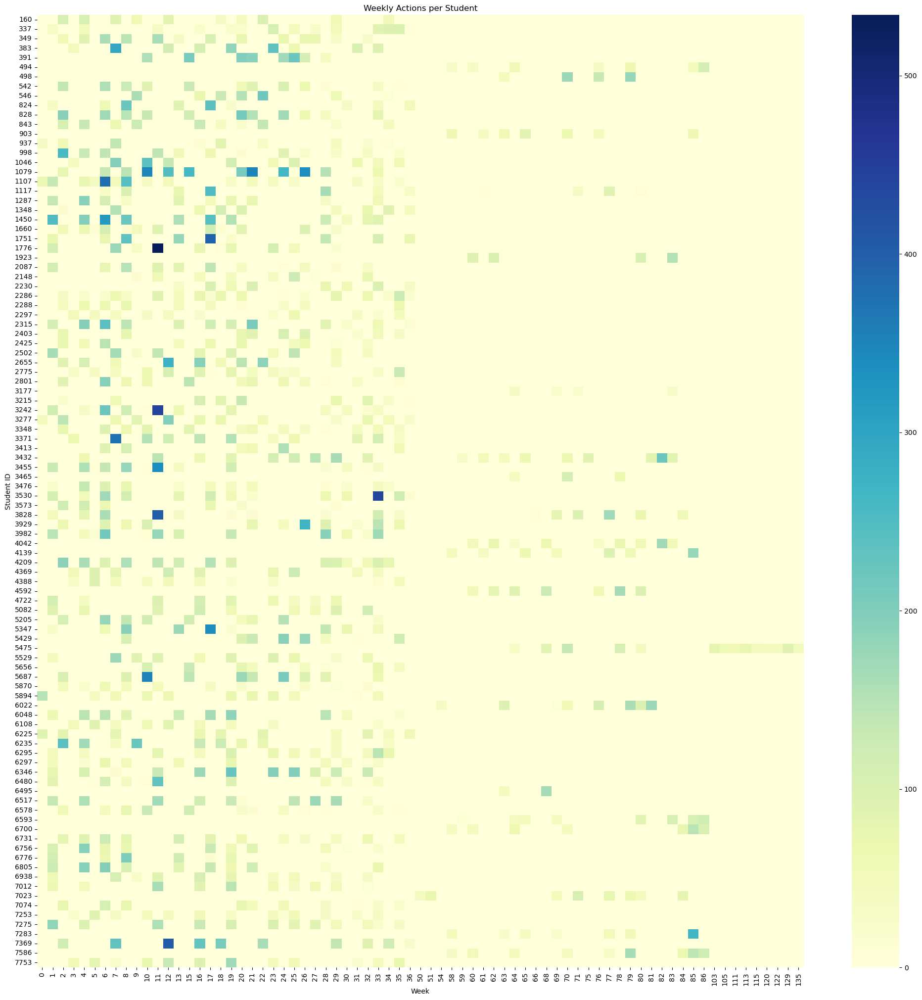

In [21]:
# Adjusting the heatmap to have 'Week' on the x-axis and 'studentId' on the y-axis

# Counting the number of actions per week per student
import random
random.seed(42)

# Randomly select 100 unique student IDs
random_students = random.sample(df_uploaded['studentId'].unique().tolist(), 100)

# Create a subset of the data for the selected students
subset_data = df_uploaded[df_uploaded['studentId'].isin(random_students)]

# Count the number of actions per week per student in the subset
weekly_actions_per_student = subset_data.groupby(['studentId', 'Week']).size().unstack(fill_value=0)


#weekly_actions_per_student = df_uploaded.groupby(['studentId', 'Week']).size().unstack(fill_value=0)

# Plotting the heatmap
plt.figure(figsize=(25, 25))
cmap = sns.color_palette("YlGnBu", as_cmap=True)
sns.heatmap(weekly_actions_per_student, cmap=cmap)

plt.title('Weekly Actions per Student')
plt.xlabel('Week')
plt.ylabel('Student ID')
plt.show()

# In this heatmap, each row represents a different student and each column represents a different week.


Data Preparation:

First, the strttimedt column, which contains the start times of actions in a date-time format, is converted into a Python datetime object. This is necessary for accurately extracting date-related information like the week number.
Then, the week number is extracted from these datetime objects. In the provided script, this is done using the dt.isocalendar().week method, which calculates the ISO week number of the year for each date.
Grouping and Counting:

The dataset is then grouped by two columns: studentId and the calculated Week. The groupby function in pandas is used for this purpose. Grouping by studentId and Week means that the data is being organized such that all actions of a particular student in a specific week are grouped together.
The size() function is applied to each group to count the number of actions. This function counts the number of occurrences in each group, giving us the total number of actions per student per week.
The unstack method is then used to pivot the week data, creating a matrix where each row represents a student and each column represents a week. The values in the matrix are the counts of actions. If there are no actions for a particular student-week combination, it's filled with a zero (this is ensured by the fill_value=0 argument).
Heatmap Visualization:

A heatmap is created using seaborn's heatmap function. In this heatmap, the rows correspond to studentIds and the columns correspond to weeks.
The color intensity in the heatmap represents the number of actions. Darker colors indicate a higher number of actions, while lighter colors indicate fewer actions.
In summary, the weekly actions per student are calculated by first determining the week number for each action, then grouping the dataset by student and week, and counting the number of actions in each group. This count is then visualized in a heatmap format.

From the heatmap we generated, here's a detailed analysis based on the visual information:

Variation in Student Activity: There is noticeable variation in activity levels among different students. Some students (rows) show more consistent and higher levels of activity (darker shades), indicating regular engagement with the tasks or platform. In contrast, others display much lower levels of activity (lighter shades).

Temporal Fluctuations: The activity levels fluctuate across different weeks. This can be seen in the varying intensity of colors across the columns. These fluctuations could be due to various factors like academic schedules, assignment deadlines, holidays, or exam periods.

High Activity Periods: Certain weeks show higher overall activity across multiple students, indicated by generally darker columns. This suggests that these weeks might have critical activities or requirements that prompt more student engagement.

Low Activity Periods: Conversely, some weeks have lower activity levels overall, which might coincide with breaks, less intensive study periods, or times when students are not required to engage as much with the material.

Individual Differences: Some students show distinct patterns of engagement, such as sporadic high activity interspersed with periods of low activity. This could reflect individual study habits, varying availability, or differing levels of motivation.

Data Consistency: If any rows or columns are uniformly light or blank, it might indicate a lack of data for those students or weeks. This could be due to technical issues, students not engaging with the platform during those times, or incomplete data collection.

Overall Engagement: The heatmap provides a general overview of how engaged the student body is over time. This can be useful for identifying trends in student engagement and could inform decisions on curriculum pacing, resource allocation, or identifying students who might need additional support.

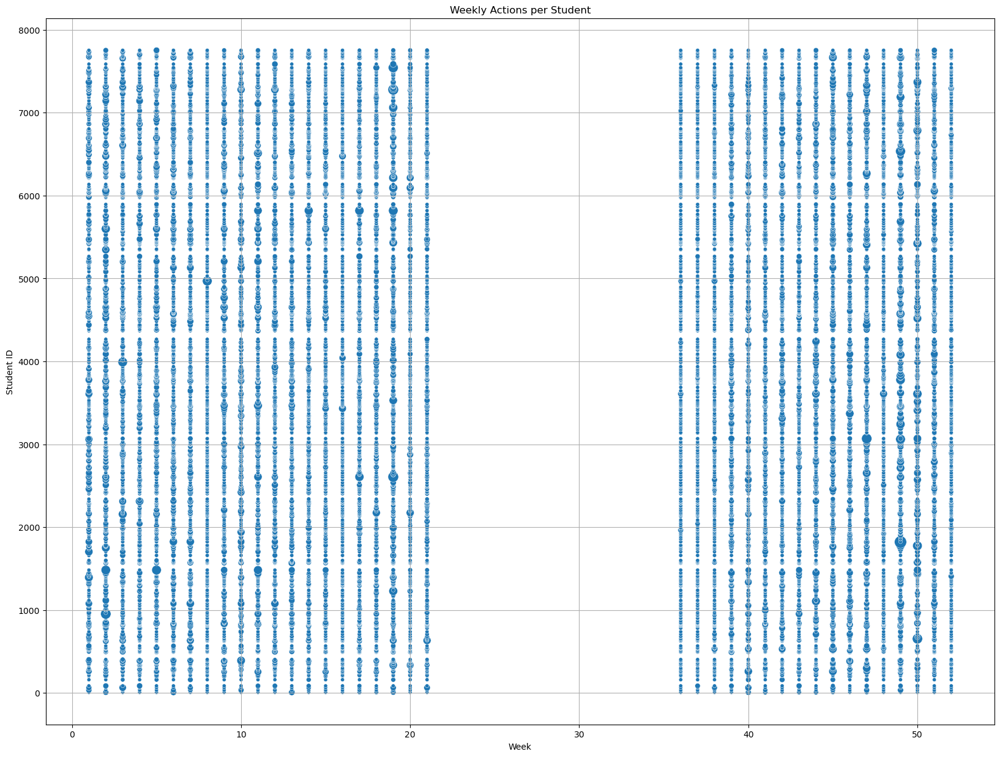

In [15]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming 'df' is your DataFrame and 'weekly_actions_per_student' is already calculated

# Convert the DataFrame from wide to long format
long_df = weekly_actions_per_student.reset_index().melt(id_vars='studentId', var_name='Week', value_name='Actions')

# Plotting
plt.figure(figsize=(20, 15))
sns.scatterplot(data=long_df, x='Week', y='studentId', size='Actions', legend=False, sizes=(20, 200))
plt.title('Weekly Actions per Student')
plt.xlabel('Week')
plt.ylabel('Student ID')
plt.grid(True)
plt.show()


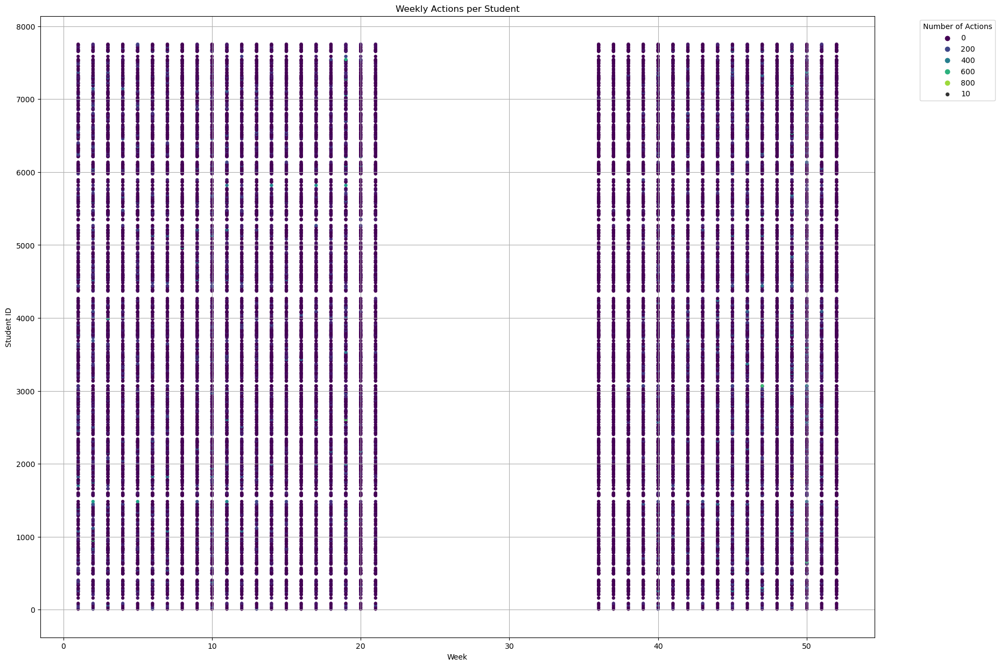

In [6]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming 'df' is your DataFrame and 'weekly_actions_per_student' is already calculated

# Convert the DataFrame from wide to long format
long_df = weekly_actions_per_student.reset_index().melt(id_vars='studentId', var_name='Week', value_name='Actions')

# Plotting
plt.figure(figsize=(20, 15))
sns.scatterplot(data=long_df, x='Week', y='studentId', hue='Actions', palette='viridis', edgecolor=None, size=10)
plt.title('Weekly Actions per Student')
plt.xlabel('Week')
plt.ylabel('Student ID')
plt.legend(title='Number of Actions', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.show()


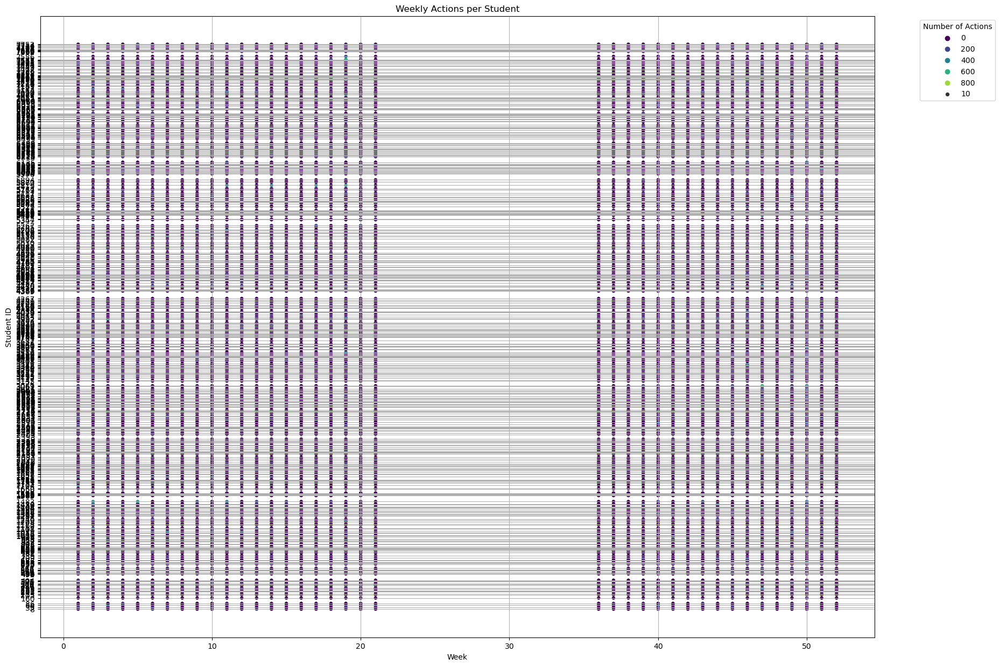

In [7]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming 'df' is your DataFrame and 'weekly_actions_per_student' is already calculated

# Convert the DataFrame from wide to long format
long_df = weekly_actions_per_student.reset_index().melt(id_vars='studentId', var_name='Week', value_name='Actions')

# Plotting
plt.figure(figsize=(20, 15))
sns.scatterplot(data=long_df, x='Week', y='studentId', hue='Actions', palette='viridis', edgecolor=None, size=10)
plt.title('Weekly Actions per Student')
plt.xlabel('Week')
plt.ylabel('Student ID')
plt.yticks(weekly_actions_per_student.index)  # Setting y-axis ticks to student IDs
plt.legend(title='Number of Actions', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.show()


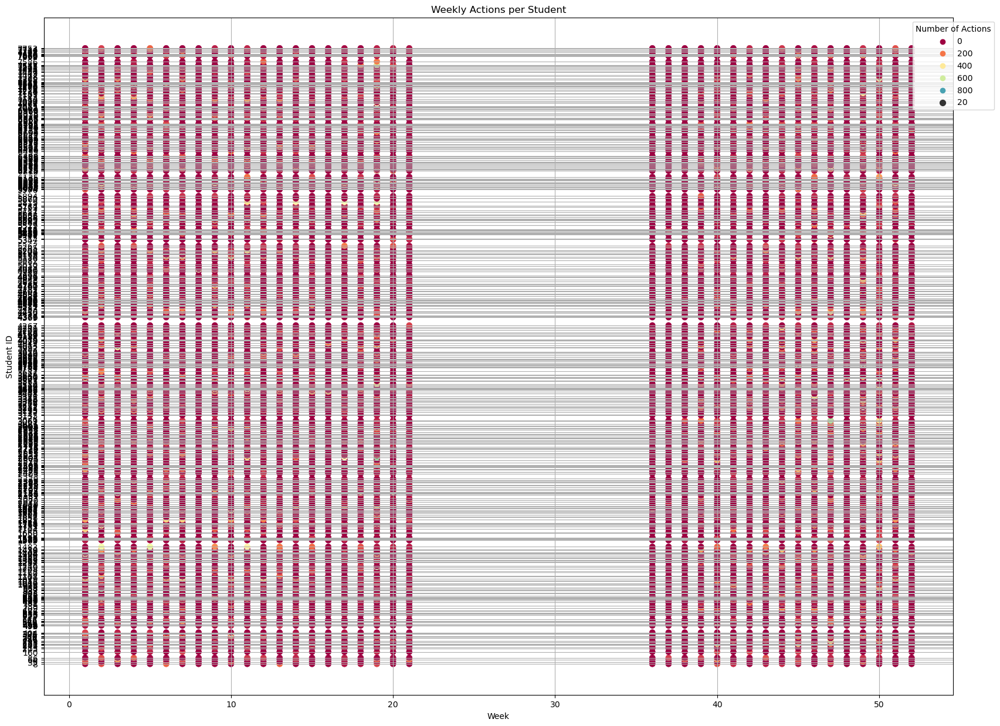

In [8]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming 'df' is your DataFrame and 'weekly_actions_per_student' is already calculated

# Convert the DataFrame from wide to long format
long_df = weekly_actions_per_student.reset_index().melt(id_vars='studentId', var_name='Week', value_name='Actions')

# Plotting
plt.figure(figsize=(20, 15))
scatter_plot = sns.scatterplot(data=long_df, x='Week', y='studentId', hue='Actions', 
                               palette='Spectral', edgecolor=None, size=20, sizes=(50, 50))
plt.title('Weekly Actions per Student')
plt.xlabel('Week')
plt.ylabel('Student ID')
plt.yticks(weekly_actions_per_student.index)  # Setting y-axis ticks to student IDs
plt.grid(True)
scatter_legend = scatter_plot.get_legend()
scatter_legend.set_title('Number of Actions')
scatter_legend.set_bbox_to_anchor((1.05, 1))
plt.show()


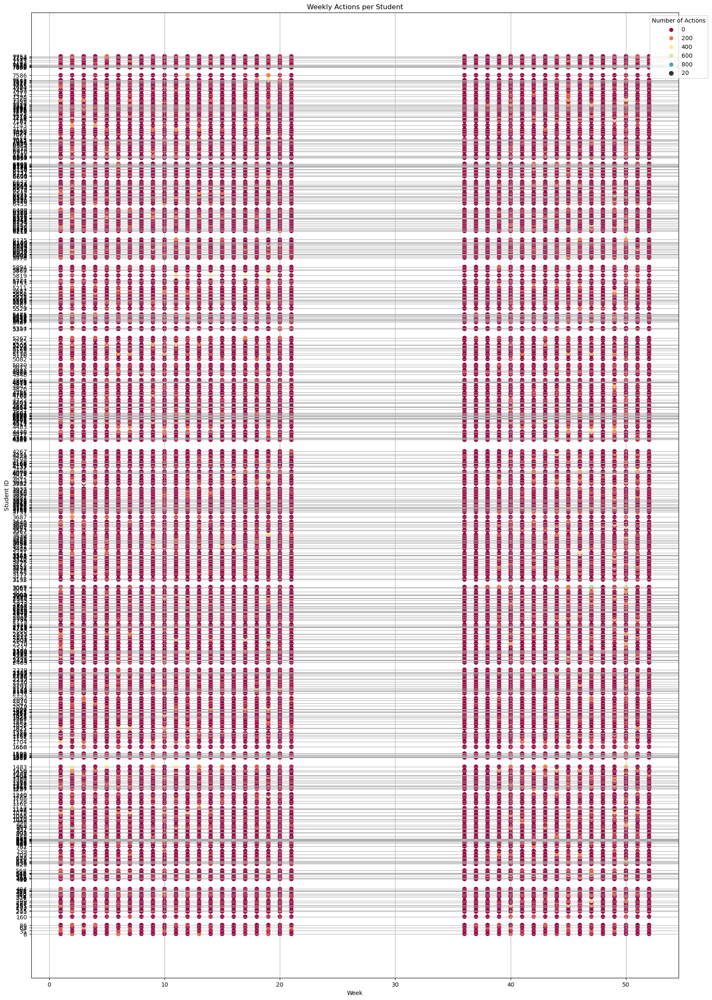

In [9]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming 'df' is your DataFrame and 'weekly_actions_per_student' is already calculated

# Convert the DataFrame from wide to long format
long_df = weekly_actions_per_student.reset_index().melt(id_vars='studentId', var_name='Week', value_name='Actions')

# Plotting with increased figure size for better spacing of student IDs
plt.figure(figsize=(20, 30))  # Increased the figure height
scatter_plot = sns.scatterplot(data=long_df, x='Week', y='studentId', hue='Actions', 
                               palette='Spectral', edgecolor=None, size=20, sizes=(50, 50))
plt.title('Weekly Actions per Student')
plt.xlabel('Week')
plt.ylabel('Student ID')
plt.yticks(weekly_actions_per_student.index)  # Setting y-axis ticks to student IDs
plt.grid(True)
scatter_legend = scatter_plot.get_legend()
scatter_legend.set_title('Number of Actions')
scatter_legend.set_bbox_to_anchor((1.05, 1))
plt.show()


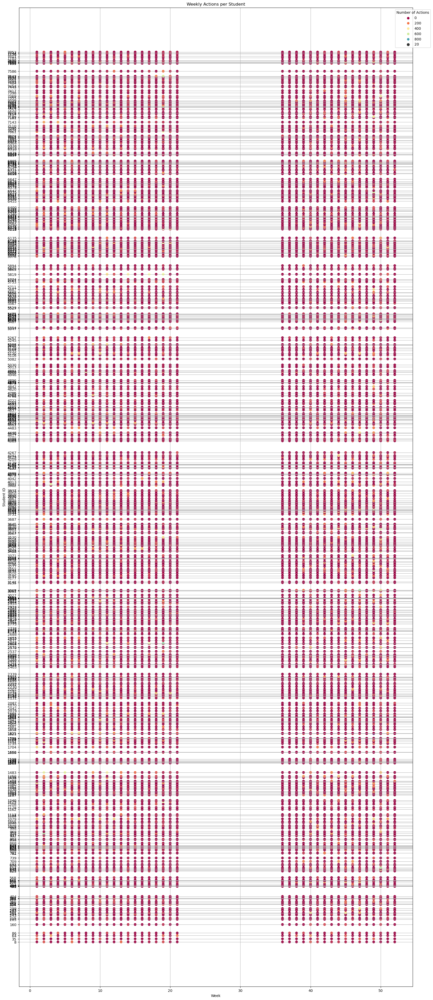

In [10]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming 'df' is your DataFrame and 'weekly_actions_per_student' is already calculated

# Convert the DataFrame from wide to long format
long_df = weekly_actions_per_student.reset_index().melt(id_vars='studentId', var_name='Week', value_name='Actions')

# Plotting with a significantly increased figure size
plt.figure(figsize=(20, 50))  # Significantly increased the figure height
scatter_plot = sns.scatterplot(data=long_df, x='Week', y='studentId', hue='Actions', 
                               palette='Spectral', edgecolor=None, size=20, sizes=(50, 50))
plt.title('Weekly Actions per Student')
plt.xlabel('Week')
plt.ylabel('Student ID')
plt.yticks(weekly_actions_per_student.index)  # Setting y-axis ticks to student IDs
plt.grid(True)
scatter_legend = scatter_plot.get_legend()
scatter_legend.set_title('Number of Actions')
scatter_legend.set_bbox_to_anchor((1.05, 1))
plt.show()


In [12]:
import pandas as pd

# Assuming 'df' is your DataFrame

# Group by studentId and find the maximum week for each student
max_weeks_per_student = df_uploaded.groupby('studentId')['Week'].max()

# Check the description of the maximum weeks
max_weeks_description = max_weeks_per_student.describe()

# You can print or view the description to understand the range and distribution
print(max_weeks_description)


count        508.0
mean     49.173228
std       4.366078
min           17.0
25%           49.0
50%           50.0
75%           51.0
max           52.0
Name: Week, dtype: Float64


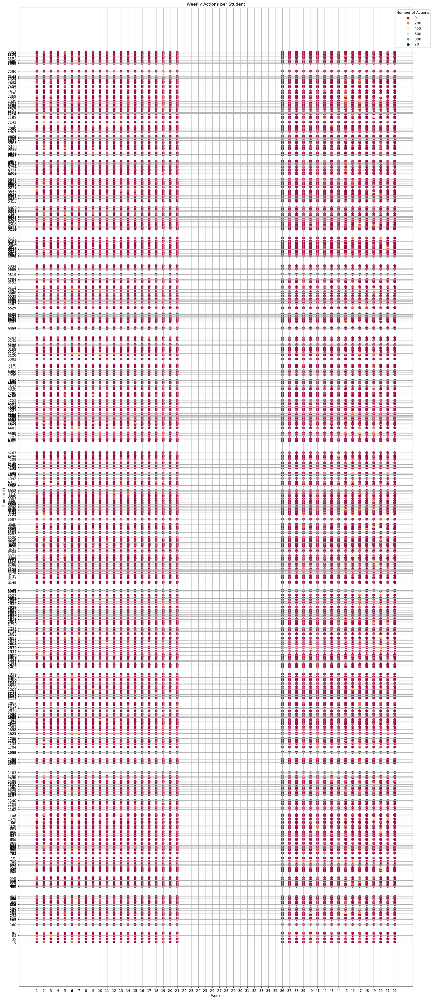

In [13]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming 'df' is your DataFrame and 'weekly_actions_per_student' is already calculated

# Convert the DataFrame from wide to long format
long_df = weekly_actions_per_student.reset_index().melt(id_vars='studentId', var_name='Week', value_name='Actions')

# Determine the full range of weeks
min_week = long_df['Week'].min()
max_week = long_df['Week'].max()

# Plotting with every week included on the x-axis
plt.figure(figsize=(20, 50))  # Adjust size as needed
scatter_plot = sns.scatterplot(data=long_df, x='Week', y='studentId', hue='Actions', 
                               palette='Spectral', edgecolor=None, size=20, sizes=(50, 50))
plt.title('Weekly Actions per Student')
plt.xlabel('Week')
plt.ylabel('Student ID')
plt.yticks(weekly_actions_per_student.index)  # Setting y-axis ticks to student IDs
plt.xticks(range(min_week, max_week + 1))  # Setting x-axis ticks to every week
plt.grid(True)
scatter_legend = scatter_plot.get_legend()
scatter_legend.set_title('Number of Actions')
scatter_legend.set_bbox_to_anchor((1.05, 1))
plt.show()
